https://medium.com/@judaikawa/price-elasticity-statistical-modeling-in-the-retail-industry-a-quick-overview-fdab5350222

https://www.statworx.com/de/blog/food-for-regression-using-sales-data-to-identify-price-elasticity/



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
from pulp import *

In [2]:
#pd.set_option('display.max_rows',None,'display.max_columns', None)

In [3]:
#hotel1=pd.read_csv('Data/H1.csv')
hotel=pd.read_csv('Data/H2.csv')

In [4]:
hotel.head()

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,0,6,2015,July,27,1,0,2,1,0.0,...,No Deposit,6,NULL,0,Transient,0.0,0,0,Check-Out,2015-07-03
1,1,88,2015,July,27,1,0,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,1,Canceled,2015-07-01
2,1,65,2015,July,27,1,0,4,1,0.0,...,No Deposit,9,NULL,0,Transient,68.0,0,1,Canceled,2015-04-30
3,1,92,2015,July,27,1,2,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,2,Canceled,2015-06-23
4,1,100,2015,July,27,2,0,2,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,1,Canceled,2015-04-02


## 1. Canceled

In [5]:
hotel.IsCanceled.value_counts()

0    46228
1    33102
Name: IsCanceled, dtype: int64

In [6]:
hotel.drop(hotel.loc[hotel.IsCanceled==1].index,inplace=True)

In [7]:
hotel.IsCanceled.value_counts()

0    46228
Name: IsCanceled, dtype: int64

In [8]:
hotel.drop(columns=['IsCanceled'],inplace=True)

## 2. ArrivalDate

##### ArrivalDateMonth

In [9]:
hotel.ArrivalDateMonth.unique()

array(['July', 'August', 'September', 'October', 'November', 'December',
       'January', 'February', 'March', 'April', 'May', 'June'],
      dtype=object)

In [10]:
hotel.ArrivalDateMonth.replace(['January','February','March','April','May','June','July','August','September','October','November','December'],
                               [1,2,3,4,5,6,7,8,9,10,11,12],
                               inplace=True
                              )

In [11]:
hotel.ArrivalDateMonth.value_counts()

8     5381
7     4782
5     4579
6     4366
10    4337
9     4290
3     4072
4     4015
2     3064
11    2696
12    2392
1     2254
Name: ArrivalDateMonth, dtype: int64

##### ArrivalDateYear

In [12]:
hotel.ArrivalDateYear.value_counts()

2016    22733
2017    15817
2015     7678
Name: ArrivalDateYear, dtype: int64

## 3. Adults

In [13]:
hotel.Adults.value_counts()

2    32499
1    10425
3     2997
0      283
4       24
Name: Adults, dtype: int64

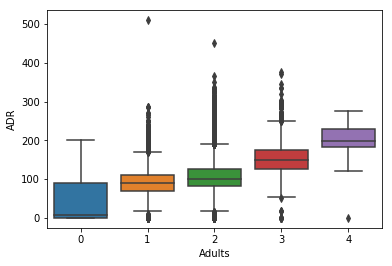

In [14]:
sns.boxplot(hotel.Adults,hotel.ADR)

## 4. Babies

In [15]:
hotel.Babies.value_counts()

0     45923
1       297
2         6
10        1
9         1
Name: Babies, dtype: int64

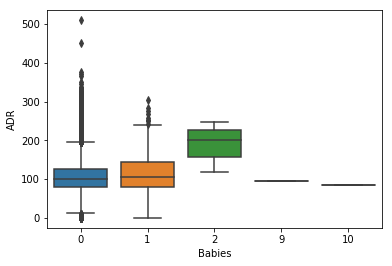

In [16]:
sns.boxplot(hotel.Babies,hotel.ADR)

In [17]:
hotel.drop(columns=['Babies'],inplace=True)

## 5. Children

In [18]:
hotel.Children.value_counts()

0.0    42934
1.0     2014
2.0     1236
3.0       44
Name: Children, dtype: int64

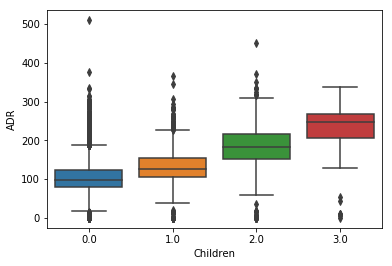

In [19]:
sns.boxplot(hotel.Children,hotel.ADR)

## 6. AssignedRoomType and ReservedRoomType

In [20]:
len(hotel.ReservedRoomType.unique())

7

In [21]:
hotel.AssignedRoomType.value_counts()

A                   30106
D                   10710
E                    1628
B                    1501
F                    1299
G                     571
K                     267
C                     146
Name: AssignedRoomType, dtype: int64

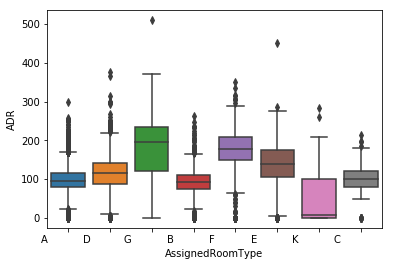

In [22]:
sns.boxplot(hotel.AssignedRoomType,hotel.ADR)

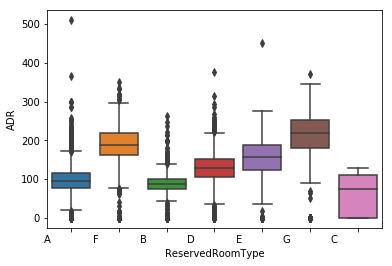

In [23]:
sns.boxplot(hotel.ReservedRoomType,hotel.ADR)

In [24]:
hotel.loc[hotel.AssignedRoomType != hotel.ReservedRoomType]

,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Meal,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
139,0,2015,7,29,15,2,5,2,0.0,SC,...,No Deposit,NULL,NULL,0,Transient,0.00,0,0,Check-Out,2015-07-22
237,20,2015,7,30,22,0,2,2,0.0,BB,...,No Deposit,1,NULL,0,Transient-Party,62.00,0,0,Check-Out,2015-07-24
250,20,2015,7,30,22,0,2,2,0.0,BB,...,No Deposit,1,NULL,0,Transient-Party,62.00,0,0,Check-Out,2015-07-24
253,20,2015,7,30,22,0,2,2,0.0,BB,...,No Deposit,1,NULL,0,Transient-Party,62.00,0,0,Check-Out,2015-07-24
267,20,2015,7,30,22,0,2,2,0.0,BB,...,No Deposit,1,NULL,0,Transient-Party,62.00,0,0,Check-Out,2015-07-24
281,20,2015,7,30,22,0,2,2,0.0,BB,...,No Deposit,1,NULL,0,Transient-Party,62.00,0,0,Check-Out,2015-07-24
289,132,2015,7,30,23,0,1,2,0.0,HB,...,No Deposit,1,NULL,0,Transient-Party,90.00,0,0,Check-Out,2015-07-24
290,132,2015,7,30,23,0,1,2,0.0,HB,...,No Deposit,1,NULL,0,Transient-Party,90.00,0,0,Check-Out,2015-07-24
303,132,2015,7,30,23,0,1,2,0.0,HB,...,No Deposit,1,NULL,0,Transient-Party,90.00,0,0,Check-Out,2015-07-24
304,132,2015,7,30,23,0,1,2,0.0,HB,...,No Deposit,1,NULL,0,Transient-Party,90.00,0,0,Check-Out,2015-07-24


## 7. ADR

If you have:

20 rooms
Each rooms sells for Rs200 per night

40% occupancy on any given night

Then your average daily rate (ADR) is:

20 rooms *0.4 occupancy = 8 rooms booked per night

8 rooms * Rs200 per night =Rs1600 Revenue earned per night

1600 revenue earned during one night / 8 rooms booked during one night =Rs200 = ADR

In [25]:
hotel.DepositType.unique()

array(['No Deposit     ', 'Refundable     ', 'Non Refund     '],
      dtype=object)

In [26]:
hotel.loc[hotel.DepositType=='No Deposit     '].ADR.value_counts()

65.00     1374
75.00     1216
0.00      1079
95.00      812
90.00      779
115.00     673
85.00      638
62.00      599
80.00      562
120.00     506
100.00     490
110.00     478
99.00      468
108.00     461
126.00     448
109.00     397
89.10      383
130.00     372
60.00      363
70.00      345
89.00      342
88.00      328
140.00     320
117.00     319
79.20      317
98.00      316
80.75      300
104.00     290
170.00     283
94.50      268
          ... 
97.32        1
182.70       1
104.08       1
241.48       1
203.40       1
236.33       1
175.88       1
93.90        1
104.42       1
167.74       1
85.63        1
106.93       1
97.60        1
182.14       1
71.22        1
155.10       1
94.78        1
114.20       1
223.32       1
123.23       1
122.43       1
121.48       1
114.84       1
124.53       1
112.45       1
86.45        1
93.94        1
84.31        1
102.37       1
61.41        1
Name: ADR, Length: 4495, dtype: int64

In [27]:
hotel.loc[hotel.ADR==0].ADR.count()

1079

In [35]:
hotel.drop(hotel[hotel.ADR==0].index,axis=0,inplace=True)

In [36]:
hotel.shape

(45149, 29)

## LeadTime

In [34]:
pd.set_option('display.max_rows',None)
hotel.LeadTime.value_counts()

0      2443
1      1539
2       955
4       884
3       859
5       773
6       700
7       623
8       577
12      519
14      491
11      489
16      485
9       453
13      420
10      411
17      393
19      383
18      372
15      371
20      370
34      361
28      334
29      332
55      316
39      308
35      306
41      300
21      296
36      295
32      294
22      292
31      289
40      277
25      276
53      274
44      274
24      271
47      261
48      257
23      255
33      253
30      249
69      248
27      246
26      240
56      235
72      223
59      223
68      220
46      218
102     214
57      213
86      211
45      211
50      210
43      208
64      205
98      204
74      204
42      203
37      198
63      196
75      193
49      192
116     191
54      191
83      188
84      187
38      185
60      185
58      184
66      184
61      183
80      180
88      173
192     172
65      170
70      170
115     168
67      167
95      162
99      160
62  

In [192]:
hotel.loc[hotel.LeadTime==hotel.LeadTime.max()]

,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Meal,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
Date,,,,,,,,,,,,,,,,,,,,,
2017-08-26,518,2017,8,34,26,2,1,2,0.0,BB,...,No Deposit,229,NULL,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29
2017-08-26,518,2017,8,34,26,2,1,2,0.0,BB,...,No Deposit,229,NULL,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29
2017-08-26,518,2017,8,34,26,2,1,2,0.0,BB,...,No Deposit,229,NULL,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29
2017-08-26,518,2017,8,34,26,2,1,2,0.0,BB,...,No Deposit,229,NULL,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29
2017-08-26,518,2017,8,34,26,2,1,2,0.0,BB,...,No Deposit,229,NULL,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29
2017-08-26,518,2017,8,34,26,2,1,2,0.0,BB,...,No Deposit,229,NULL,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29
2017-08-26,518,2017,8,34,26,2,1,2,0.0,BB,...,No Deposit,229,NULL,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29
2017-08-26,518,2017,8,34,26,2,1,2,0.0,BB,...,No Deposit,229,NULL,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29
2017-08-26,518,2017,8,34,26,2,1,2,0.0,BB,...,No Deposit,229,NULL,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29


In [37]:
hotel.shape

(45149, 29)

In [38]:
# We have to restrict the lead time to some quantities

hotel.loc[hotel.LeadTime<=150].LeadTime.count()

36673

# 8. GroupBy Time

In [39]:
temp=(hotel.groupby(['ArrivalDateYear','ArrivalDateMonth','ArrivalDateDayOfMonth']))

In [40]:
plotData=pd.DataFrame(columns=['Time','Count'],index=None)
plotData.Time.astype(str, copy = False)
plotData['Count'] = plotData['Count'].astype(np.int64)

In [41]:
tempCount=pd.DataFrame(temp.count().ADR)

In [42]:
for index,row in tempCount.iterrows():
    #print(row.IsCanceled)
    #print(row.IsCanceled.dtype)
    DateString=str(index[0])+'-'+str(index[1])+'-'+str(index[2])
    s={'Time':DateString,'Count':row.ADR}
    plotData=plotData.append(s,ignore_index=True)

In [43]:
plotData['Time'] =  pd.to_datetime(plotData['Time'], format='%Y-%m-%d')
plotData.index=plotData.Time
plotData.drop(columns=['Time'],inplace=True)
plotData

,Count
Time,
2015-07-01,64
2015-07-02,1
2015-07-03,10
2015-07-04,9
2015-07-06,1
2015-07-07,2
2015-07-08,22
2015-07-09,1
2015-07-10,2


In [44]:
# Filling the dates which have no entries with 0
idx = pd.date_range('2015-07-01', '2017-08-31')
plotData = plotData.reindex(idx, fill_value=0)

In [45]:
plotData[plotData.Count<=0]

,Count
2015-07-05,0
2015-07-12,0
2015-07-14,0
2015-07-16,0
2015-07-19,0
2015-07-21,0
2015-07-24,0
2015-07-26,0


## Seasonality

In [46]:
# #Plotting seasonality ,trend and residual with decomposition method
# plt.figure(figsize=(20,40))
# from statsmodels.tsa.seasonal import seasonal_decompose
# decomposition = seasonal_decompose(plotData,freq=300)

# trend = decomposition.trend
# seasonal = decomposition.seasonal
# residual = decomposition.resid

# plt.subplot(411)
# plt.plot(plotData, label='Original')
# plt.legend(loc='best')

# plt.subplot(412)
# plt.plot(trend, label='Trend')
# plt.legend(loc='best')

# plt.subplot(413)
# plt.plot(seasonal,label='Seasonality')
# plt.legend(loc='best')

# plt.subplot(414)
# plt.plot(residual, label='Residuals')
# plt.legend(loc='best')

# plt.tight_layout()

## 9. TotalNumberOfRooms

In [47]:
totalRooms=temp.count().ADR.max()
totalRooms
#We have rooms booked on a respective date
#We can now find vacant rooms also

202

# Hotel Prespective Dataset

### Data Preprocessing

1. Remove year,month,date,week and add date as INDEX.
2. Total nights= weekendNights + WeekNights

Now we have to make dataset for each date;
1. Index= Date
2. ADR = sum of ADR of current dates + sum of ADR of previous booking extending till current dates.
3. Count(Occupied Rooms) = sum of bookings of current dates + sum of bookings extending till current date. 
4. Total Number of rooms= max(count)


In [48]:
## Changing index to date

hotel.index=pd.to_datetime(hotel.ArrivalDateYear*10000+hotel.ArrivalDateMonth*100+hotel.ArrivalDateDayOfMonth,format='%Y%m%d')
hotel.index.name='Date'

In [44]:
hotel.head()

,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Meal,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
Date,,,,,,,,,,,,,,,,,,,,,
2015-07-02,3,2015,7,27,2,0,3,1,0.0,HB,...,No Deposit,1,NULL,0,Transient-Party,58.67,0,0,Check-Out,2015-07-05
2015-07-03,43,2015,7,27,3,0,2,2,0.0,HB,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
2015-07-03,43,2015,7,27,3,0,2,2,0.0,HB,...,No Deposit,1,NULL,0,Transient-Party,43.00,0,0,Check-Out,2015-07-05
2015-07-03,43,2015,7,27,3,0,2,2,0.0,HB,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
2015-07-03,4,2015,7,27,3,0,2,1,0.0,HB,...,No Deposit,1,NULL,0,Transient-Party,63.00,0,0,Check-Out,2015-07-05


## HotelData

In [61]:
bookingData=pd.DataFrame(columns=['TotalNights','RevenuePerDay','RoomsBooked','LeadTime'])
bookingData['TotalNights'] = bookingData['TotalNights'].astype(np.int64)
bookingData['RevenuePerDay'] = bookingData['RevenuePerDay'].astype(np.float64)
bookingData['RoomsBooked'] = bookingData['RoomsBooked'].astype(np.int64)
bookingData['LeadTime'] = bookingData['LeadTime'].astype(np.int64)


bookingData.dtypes

TotalNights        int64
RevenuePerDay    float64
RoomsBooked        int64
LeadTime           int64
dtype: object

In [62]:
bookingData.index.name='Date'

In [63]:
for index, row in hotel.iterrows():
    total=row['StaysInWeekendNights']+row['StaysInWeekNights']
    adr=row['ADR']
    x={ 'TotalNights':total,
        'RevenuePerDay':adr,
        'LeadTime':row['LeadTime'],
        'RoomsBooked':1}
    bookingData=bookingData.append(x,ignore_index=True)

In [64]:
bookingData.index=hotel.index

In [65]:
bookingData

,TotalNights,RevenuePerDay,RoomsBooked,LeadTime
Date,,,,
2015-07-02,3.0,58.67,1.0,3.0
2015-07-03,2.0,86.00,1.0,43.0
2015-07-03,2.0,43.00,1.0,43.0
2015-07-03,2.0,86.00,1.0,43.0
2015-07-03,2.0,63.00,1.0,4.0
2015-07-03,2.0,63.00,1.0,43.0
2015-07-03,2.0,86.00,1.0,43.0
2015-07-03,2.0,86.00,1.0,43.0
2015-07-03,2.0,86.00,1.0,43.0


## Method-1 : Hotel Daily Data

In [50]:
nestedDict={}
for index, row in hotelData.iterrows():
    key=index
    days=row['TotalNights']
    adr=row['TotalRevenue']
    if key not in nestedDict:
        nestedDict[key]={days:adr}
    else:
        if days in nestedDict[key]:
            #days are already present in dictionary
            #So revenue currently for that date = prevadr
            prevRevenue=nestedDict[key][days]
            nestedDict[key][days]=prevRevenue+adr
        else:
            nestedDict[key][days]=adr

Now we have made a dictionary with:-

    key=date
    Value= {
               TotalNumberOfNights:TotalRevenue
               TotalNumberOfNights:TotalRevenue
               .
               .
               .
           }

In [51]:
nestedDict

{Timestamp('2015-07-02 00:00:00'): {3.0: 58.67},
 Timestamp('2015-07-03 00:00:00'): {2.0: 685.0, 7.0: 60.27},
 Timestamp('2015-07-04 00:00:00'): {4.0: 574.0},
 Timestamp('2015-07-07 00:00:00'): {2.0: 76.08, 10.0: 62.37},
 Timestamp('2015-07-08 00:00:00'): {2.0: 1282.0, 5.0: 144.0},
 Timestamp('2015-07-09 00:00:00'): {5.0: 58.9},
 Timestamp('2015-07-10 00:00:00'): {5.0: 106.25, 4.0: 80.44},
 Timestamp('2015-07-11 00:00:00'): {1.0: 282.92, 3.0: 2418.32},
 Timestamp('2015-07-13 00:00:00'): {1.0: 63.75},
 Timestamp('2015-07-18 00:00:00'): {2.0: 1531.25,
  3.0: 661.5,
  4.0: 764.0,
  5.0: 62.0},
 Timestamp('2015-07-20 00:00:00'): {2.0: 46.66, 4.0: 104.0},
 Timestamp('2015-07-22 00:00:00'): {2.0: 1421.96},
 Timestamp('2015-07-23 00:00:00'): {1.0: 3246.8999999999996},
 Timestamp('2015-07-25 00:00:00'): {1.0: 1421.5, 3.0: 1225.95, 4.0: 1115.0},
 Timestamp('2015-07-27 00:00:00'): {2.0: 1114.0,
  3.0: 378.5,
  10.0: 125.30000000000001},
 Timestamp('2015-07-28 00:00:00'): {2.0: 65.0, 3.0: 91.38, 

### hotelDailyData

In [141]:
len(nestedDict)

785

In [142]:
temp=np.zeros((785,2))

In [143]:
hotelDailyData=pd.DataFrame(temp,index=nestedDict.keys(),columns=['Revenue','RoomsBooked'])
hotelDailyData['Revenue'] = hotelDailyData['Revenue'].astype(np.float64)
hotelDailyData['RoomsBooked'] = hotelDailyData['RoomsBooked'].astype(np.int64)

hotelDailyData.dtypes

Revenue        float64
RoomsBooked      int64
dtype: object

In [144]:
idx = pd.date_range('2015-07-01', '2017-09-07')
hotelDailyData = hotelDailyData.reindex(idx, fill_value=0)

In [145]:
#hotelDailyData.count()
# We have no bookings on 8 days but this does't implies hotel is empty
# There may pe privious ongoing bookings

In [146]:
hotelDailyData.head()

,Revenue,RoomsBooked
2015-07-01,0.0,0
2015-07-02,0.0,0
2015-07-03,0.0,0
2015-07-04,0.0,0
2015-07-05,0.0,0


In [147]:
# Filling RoomsBooked

for index,row in hotelData.iterrows():
    days=row['TotalNights']
    hotelDailyData.loc[index,"RoomsBooked"]=hotelDailyData.loc[index,"RoomsBooked"]+1
    hotelDailyData.loc[index+datetime.timedelta(days=days),"RoomsBooked"]=hotelDailyData.loc[index+datetime.timedelta(days=days),"RoomsBooked"]-1

In [148]:
#Filling Revenue

for date in nestedDict.keys():
    for day in nestedDict[date].keys():
        revenue=nestedDict[date][day]
        hotelDailyData.loc[date,"Revenue"]+=revenue
        nextdate=date+datetime.timedelta(days=day)
        hotelDailyData.loc[nextdate,"Revenue"]-=revenue

In [150]:
for i in range(1,len(hotelDailyData)):
    
    hotelDailyData.iloc[i,hotelDailyData.columns.get_loc('Revenue')]=hotelDailyData.iloc[i-1,hotelDailyData.columns.get_loc('Revenue')]+hotelDailyData.iloc[i,hotelDailyData.columns.get_loc('Revenue')]
    hotelDailyData.iloc[i,hotelDailyData.columns.get_loc('RoomsBooked')]=hotelDailyData.iloc[i-1,hotelDailyData.columns.get_loc('RoomsBooked')]+hotelDailyData.iloc[i,hotelDailyData.columns.get_loc('RoomsBooked')]    

In [157]:
hotelDailyData.drop(index=datetime.datetime(2017,9,7),inplace=True)

In [163]:
hotelDailyData.head()

,Revenue,RoomsBooked
2015-07-01,6180.00,64
2015-07-02,6238.67,65
2015-07-03,991.94,13
2015-07-04,1565.94,22
2015-07-05,822.27,12


In [178]:
hotelDailyData['Revenue']=hotelDailyData['Revenue']/hotelDailyData['RoomsBooked']

In [182]:
hotelDailyData.rename(columns={'Revenue':'Price'},inplace=True)

In [183]:
hotelDailyData.head()

,Price,RoomsBooked
2015-07-01,96.562500,64
2015-07-02,95.979538,65
2015-07-03,76.303077,13
2015-07-04,71.179091,22
2015-07-05,68.522500,12


In [176]:
# Checking for negative values
for i in range(len(hotelDailyData)):
    if hotelDailyData.iloc[i].RoomsBooked <0:
        print('wrong')
    if hotelDailyData.iloc[i].Revenue <0:
        print('wrong')

In [177]:
TotalNumberOfRooms=hotelDailyData.RoomsBooked.max()
TotalNumberOfRooms


225

In [167]:
quantityData=pd.DataFrame(hotelDailyData)
quantityData.drop(columns=['Revenue'],inplace=True)

In [168]:
quantityData.head()

,RoomsBooked
2015-07-01,64
2015-07-02,65
2015-07-03,13
2015-07-04,22
2015-07-05,12


In [171]:
quantityData.to_csv(r'C:\Users\vaibhavgupta02\Desktop\Intern\Hotel Problem Statement\Data\seasonalityData.csv')

## Method-2 : Hotel Daily Data

In [ ]:
# #HotelDailyData

# hotelDailyData=pd.DataFrame(columns=['Revenue','RoomsBooked'])
# hotelDailyData['Revenue'] = hotelDailyData['Revenue'].astype(np.float64)
# hotelDailyData['RoomsBooked'] = hotelDailyData['RoomsBooked'].astype(np.int64)

# hotelDailyData.dtypes

In [ ]:
# hotelData.head()

In [ ]:
# for index,row in hotelData.iterrows():
    
#     if row['TotalNights']>1:
        
#     else:
#         hotelDailyData.append()

# Elasticity Model

In [186]:
hotelDailyData

,Price,RoomsBooked
2015-07-01,96.562500,64
2015-07-02,95.979538,65
2015-07-03,76.303077,13
2015-07-04,71.179091,22
2015-07-05,68.522500,12
2015-07-06,63.672727,11
2015-07-07,64.393333,12
2015-07-08,64.988800,25
2015-07-09,64.301600,25
2015-07-10,75.326667,6


In [184]:
from __future__ import print_function
from statsmodels.compat import lzip
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [188]:
model=ols("np.log(RoomsBooked)~np.log(Price)",data=hotelDailyData).fit()

<string>:1: RuntimeWarning: divide by zero encountered in log
<string>:1: RuntimeWarning: divide by zero encountered in log


In [189]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     np.log(RoomsBooked)   R-squared:                       0.373
Model:                             OLS   Adj. R-squared:                  0.372
Method:                  Least Squares   F-statistic:                     473.3
Date:                 Tue, 02 Jul 2019   Prob (F-statistic):           1.02e-82
Time:                         14:45:48   Log-Likelihood:                -563.47
No. Observations:                  798   AIC:                             1131.
Df Residuals:                      796   BIC:                             1140.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        -3.5665      0.394     -9.056      0.000      -4.340      -2.793
np.log(Price)     1.8561      0.085     21.756      0.000       1.689       2.024
==============================================================================
Omnibus:                      627.248   Durbin-Watson:                   0.330
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            16109.497
Skew:                          -3.346   Prob(JB):                         0.00
Kurtosis:                      23.970   Cond. No.                         110.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""